In [1]:
from google.colab import drive

In [2]:
drive.mount('/content/drive')

Mounted at /content/drive


## Importación de librerías y funciones definidas por usuario

Librerías

In [3]:
%%capture
#evita que se despliegue toda la informacion de pip install

# Librerías estándar
import os
import warnings
import math

# Manipulación de datos
import pandas as pd
import numpy as np

# Configuración de warnings
warnings.filterwarnings('ignore')

# Análisis de nulos
import missingno as msno

# Visualización de datos
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

# EDA
!pip install ydata-profiling
from ydata_profiling import ProfileReport

# Textos
import unicodedata
#!pip install fuzzywuzzy
#from fuzzywuzzy import process
import re

# Preprocesamiento de datos y ML
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier


# Evaluacion
from sklearn.metrics import accuracy_score, precision_score, recall_score, roc_auc_score, roc_curve, f1_score, confusion_matrix, classification_report
from sklearn.model_selection import train_test_split

# warnings
import warnings
warnings.filterwarnings('ignore')

pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

#!pip install gdown


Funciones:

In [4]:
import sys
sys.path.append('/content/drive/MyDrive/NUCLIO/TFM/02_scripts') #de uso solo del propietario
#sys.path.append('/content/drive/MyDrive/Colab Notebooks/funciones') #de uso en colab Fernando, no borrar, solo comentar!
from funciones import *

##########################################################################################


## Importar datos


In [5]:
'''
#path = '/content/drive/MyDrive/NUCLIO/TFM/00_data/raw' #ruta especifica para el drive de Augusto, NO TOCAR
path = '/content/drive/MyDrive/Colab Notebooks' #por definir como podemos tener acceso todos al mismo archivo csv. Aqui cada quien puede comentar el path anterior y usar el que aplica para su propio drive

# 2. Lista todos los archivos del directorio
lista = os.listdir(path)

# 3. Filtra solo los archivos .csv (opcional)
csv_files = [file for file in lista if (file.endswith('.csv') | file.endswith('.xlsx'))]

csv_files = sorted(csv_files)
csv_files
'''

"\n#path = '/content/drive/MyDrive/NUCLIO/TFM/00_data/raw' #ruta especifica para el drive de Augusto, NO TOCAR\npath = '/content/drive/MyDrive/Colab Notebooks' #por definir como podemos tener acceso todos al mismo archivo csv. Aqui cada quien puede comentar el path anterior y usar el que aplica para su propio drive\n\n# 2. Lista todos los archivos del directorio\nlista = os.listdir(path)\n\n# 3. Filtra solo los archivos .csv (opcional)\ncsv_files = [file for file in lista if (file.endswith('.csv') | file.endswith('.xlsx'))]\n\ncsv_files = sorted(csv_files)\ncsv_files\n"

In [6]:
'''
diccionario_datos = {}

for file in csv_files:
  ruta = os.path.join(path, file)

  if file.endswith('.xlsx'):
    df = pd.read_excel(ruta)
  elif file.endswith('.csv'):
    df = pd.read_csv(ruta, sep = ';')  # o read_excel(), etc.

  key = file.split('.')[0]
  #key = file.split('t_')[1].split('.')[0]
  diccionario_datos[key] = df
  print(f"{key}: {df.shape}")  # ejemplo: mostrar nombre y dimensiones
  '''

'\ndiccionario_datos = {}\n\nfor file in csv_files:\n  ruta = os.path.join(path, file)\n\n  if file.endswith(\'.xlsx\'):\n    df = pd.read_excel(ruta)\n  elif file.endswith(\'.csv\'):\n    df = pd.read_csv(ruta, sep = \';\')  # o read_excel(), etc.\n\n  key = file.split(\'.\')[0]\n  #key = file.split(\'t_\')[1].split(\'.\')[0]\n  diccionario_datos[key] = df\n  print(f"{key}: {df.shape}")  # ejemplo: mostrar nombre y dimensiones\n  '

In [7]:
file_id = '1X-pn19tXQSeQVVwzTRdNOs7mnapgLA_u'  # Colocar el file ID file ID que es solo la parte 1X-pn19tXQSeQVVwzTRdNOs7mnapgLA_u del link de compartir: https://drive.google.com/file/d/1X-pn19tXQSeQVVwzTRdNOs7mnapgLA_u/view?usp=drive_link
url = f'https://drive.google.com/uc?export=download&id={file_id}'
df = pd.read_csv(url,delimiter=";")
df_original = df.copy() #guardar la version original del dataframe para poder regersar a ella cuando sea


In [8]:
df.head()

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,duration,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
0,56,housemaid,married,basic.4y,no,no,no,telephone,may,mon,261,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
1,57,services,married,high.school,unknown,no,no,telephone,may,mon,149,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
2,37,services,married,high.school,no,yes,no,telephone,may,mon,226,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
3,40,admin.,married,basic.6y,no,no,no,telephone,may,mon,151,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
4,56,services,married,high.school,no,no,yes,telephone,may,mon,307,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no


# Estadistica descriptiva

In [9]:
# exploracion_inicial(df)

### Pandas profiling

In [10]:
profile = ProfileReport(df, title="Bank loan Dataset Report", explorative=True)
profile.to_file("banking_loan_dataset_report.html")

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████| 21/21 [00:03<00:00,  5.46it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [11]:
profile

In [12]:
'''
for k,v in diccionario_datos.items():
  print(k.upper())
  print('#'==90)
  exploracion_inicial(v)

  '''

"\nfor k,v in diccionario_datos.items():\n  print(k.upper())\n  print('#'==90)\n  exploracion_inicial(v)\n\n  "

In [13]:
# df=diccionario_datos.get('bank-additional_bank-additional-full') #solo hay un archivo en el diccionario, definimos el df como dicho archivo

Guardamos una version del df original

In [14]:
df_original=df

# Tratamiento de datos previo a analisis

### Identificacion y eliminacion de duplicados:

In [15]:
df[df.duplicated(keep=False)]

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,duration,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
1265,39,blue-collar,married,basic.6y,no,no,no,telephone,may,thu,124,1,999,0,nonexistent,1.1,93.994,-36.4,4.855,5191.0,no
1266,39,blue-collar,married,basic.6y,no,no,no,telephone,may,thu,124,1,999,0,nonexistent,1.1,93.994,-36.4,4.855,5191.0,no
12260,36,retired,married,unknown,no,no,no,telephone,jul,thu,88,1,999,0,nonexistent,1.4,93.918,-42.7,4.966,5228.1,no
12261,36,retired,married,unknown,no,no,no,telephone,jul,thu,88,1,999,0,nonexistent,1.4,93.918,-42.7,4.966,5228.1,no
14155,27,technician,single,professional.course,no,no,no,cellular,jul,mon,331,2,999,0,nonexistent,1.4,93.918,-42.7,4.962,5228.1,no
14234,27,technician,single,professional.course,no,no,no,cellular,jul,mon,331,2,999,0,nonexistent,1.4,93.918,-42.7,4.962,5228.1,no
16819,47,technician,divorced,high.school,no,yes,no,cellular,jul,thu,43,3,999,0,nonexistent,1.4,93.918,-42.7,4.962,5228.1,no
16956,47,technician,divorced,high.school,no,yes,no,cellular,jul,thu,43,3,999,0,nonexistent,1.4,93.918,-42.7,4.962,5228.1,no
18464,32,technician,single,professional.course,no,yes,no,cellular,jul,thu,128,1,999,0,nonexistent,1.4,93.918,-42.7,4.968,5228.1,no
18465,32,technician,single,professional.course,no,yes,no,cellular,jul,thu,128,1,999,0,nonexistent,1.4,93.918,-42.7,4.968,5228.1,no


In [16]:
df.drop_duplicates(inplace = True)

Actualizamos el df_original a la version sin duplicados

In [17]:
df_original=df

### Cambiar los atributos **default**, **housing**, **loan** y *y* de texto a booleana.

Agregamos columnas para no perder la informacion del df original.

Imputamos valores ***unknown*** como ***NaN***

In [18]:
df.columns

Index(['age', 'job', 'marital', 'education', 'default', 'housing', 'loan',
       'contact', 'month', 'day_of_week', 'duration', 'campaign', 'pdays',
       'previous', 'poutcome', 'emp.var.rate', 'cons.price.idx',
       'cons.conf.idx', 'euribor3m', 'nr.employed', 'y'],
      dtype='object')

**Imputar valores como NaN hace que no funcione el modelo de prediccion LogisticRegression**

In [19]:
'''
df['y_bool'] = df['y'].str.strip().str.lower().map({'yes': 1, 'no': 0}).astype('int64')
df['default_bool'] = df['default'].str.strip().str.lower().map({'yes': 1, 'no': 0, 'unknown': math.nan})
df['housing_bool'] = df['housing'].str.strip().str.lower().map({'yes': 1, 'no': 0, 'unknown': math.nan})
df['loan_bool'] = df['loan'].str.strip().str.lower().map({'yes': 1, 'no': 0, 'unknown': math.nan})
'''

"\ndf['y_bool'] = df['y'].str.strip().str.lower().map({'yes': 1, 'no': 0}).astype('int64')\ndf['default_bool'] = df['default'].str.strip().str.lower().map({'yes': 1, 'no': 0, 'unknown': math.nan})\ndf['housing_bool'] = df['housing'].str.strip().str.lower().map({'yes': 1, 'no': 0, 'unknown': math.nan})\ndf['loan_bool'] = df['loan'].str.strip().str.lower().map({'yes': 1, 'no': 0, 'unknown': math.nan})\n"

### Ver si hay relaciones entre los Unknowns de las diferentes columnas:

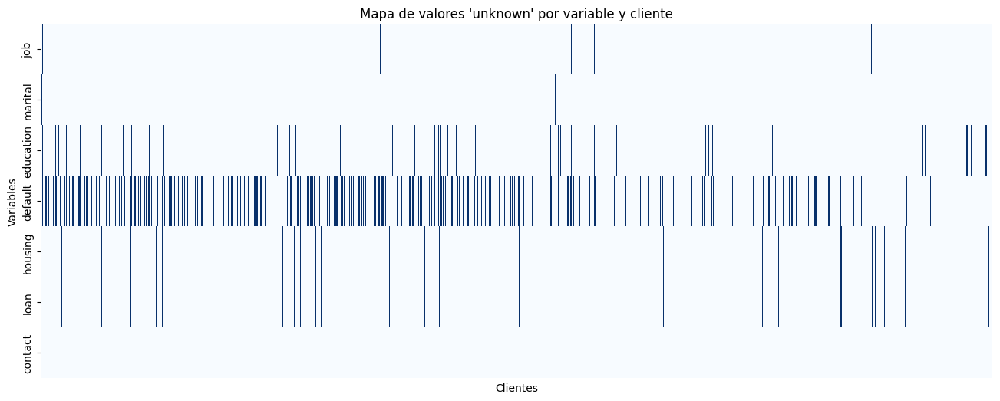

In [20]:
# Lista de columnas categóricas donde puede haber 'unknown'
cat_vars = ['job', 'marital', 'education', 'default', 'housing', 'loan', 'contact']

# Creamos un DataFrame con la proporción de "unknown" por columna
unknown_map = pd.DataFrame({col: (df[col] == 'unknown').astype(int) for col in cat_vars})

plt.figure(figsize=(16, 6))
sns.heatmap(unknown_map.T, cbar=False, cmap="Blues", xticklabels=False)
plt.title("Mapa de valores 'unknown' por variable y cliente")
plt.xlabel("Clientes")
plt.ylabel("Variables")
plt.show()

### Analisis de outliers:

In [21]:
# Ejemplo de uso:
variables_a_analizar = ['age', 'duration', 'campaign', 'pdays', 'previous',
                        'emp.var.rate', 'cons.price.idx', 'cons.conf.idx',
                        'euribor3m', 'nr.employed']

In [22]:
#resultados_outliers = deteccion_outliers_varias(df, variables_a_analizar)

Los valores atípicos reflejan comportamientos reales de clientes (variables de marketing) o condiciones macroeconómicas de contexto (variables económicas). Por ello, no las eliminaremos ni imputaremos arbitrariamente. En el caso de "pdays", corregiremos aquellos que representan errores de codificación, como el valor "999", pasandolos a NaN. En el caso de "age", vemos que los outliers no son casos irreales (min: 17, max:98), no son numerosos ya que representan solo el 1.8% de los datos y por ultimo en sexctor financiero (Banca), los clientes muy jóvenes y muy mayores pueden tener comportamientos especiales o ser targets importantes para productos concretos, por lo cual tampoco imputaremos los datos extremos (<23 y >71). Igual se hizo un analisis de impacto de aplicar transformaciones a esos outliers en el modelo de predicción mediante el corte (Winsorizar) al percentil 1 y 99, sin embargo, el resultado no cambia el recall o la precisión.

"Pdays": reemplazo de "999" por "NaN

In [23]:
# pdays: crear una binary flag, reemplazar 999 por NaN
df['was_previously_contacted'] = (df['pdays'] != 999).astype(int)
df['pdays'] = df['pdays'].replace(999, np.nan)


In [24]:
df.sample(25)

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,duration,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y,was_previously_contacted
11577,27,services,married,high.school,no,yes,no,telephone,jun,fri,172,3,NaN,0,nonexistent,1.4,94.465,-41.8,4.959,5228.1,no,0
24123,34,technician,single,unknown,no,no,no,telephone,nov,mon,101,1,NaN,0,nonexistent,-0.1,93.200,-42.0,4.191,5195.8,no,0
19834,50,blue-collar,married,basic.4y,unknown,yes,no,cellular,aug,fri,249,1,NaN,0,nonexistent,1.4,93.444,-36.1,4.966,5228.1,no,0
1073,51,blue-collar,married,basic.4y,no,no,no,telephone,may,wed,353,4,NaN,0,nonexistent,1.1,93.994,-36.4,4.856,5191.0,no,0
21588,32,technician,single,university.degree,no,no,no,cellular,aug,tue,696,1,NaN,0,nonexistent,1.4,93.444,-36.1,4.963,5228.1,no,0
15837,24,blue-collar,married,basic.9y,no,yes,no,cellular,jul,mon,46,1,NaN,0,nonexistent,1.4,93.918,-42.7,4.960,5228.1,no,0
31719,39,admin.,married,basic.9y,no,yes,no,cellular,may,thu,279,1,NaN,0,nonexistent,-1.8,92.893,-46.2,1.327,5099.1,no,0
22615,53,admin.,divorced,university.degree,no,yes,no,cellular,aug,fri,61,2,NaN,0,nonexistent,1.4,93.444,-36.1,4.964,5228.1,no,0
32658,36,blue-collar,married,basic.6y,no,no,no,cellular,may,mon,460,1,NaN,0,nonexistent,-1.8,92.893,-46.2,1.299,5099.1,no,0
3629,44,blue-collar,divorced,basic.4y,unknown,yes,no,telephone,may,fri,225,4,NaN,0,nonexistent,1.1,93.994,-36.4,4.859,5191.0,no,0


In [25]:
df_tratado=df

# Exploracion de datos

## Análisis univariable para conocer la distribución de los datos

In [26]:
graficar_barras_porcentaje_px(df, "default")

,default,Volumen,Porcentaje
0,no,32577,79.12
1,unknown,8596,20.88
2,yes,3,0.01


Porcentaje alto de "unknown" dentro de la columna "default", por lo cual la usaremos como una variable adicional.

'''
Queremos tener el dato de cuanto unknowns existen en personas que hayan contratado un deposito a plazos para ver si existe un alto riesgo de impago.

In [27]:
'''
# Filtrar clientes que suscribieron el depósito
df_yes = df[df['y'] == 'yes']

# Total de suscriptores
total_yes = df_yes.shape[0]

# Filtrar los que tienen default = "unknown"
unknown_default = df_yes[df_yes['default'] == 'unknown'].shape[0]

# Porcentaje
porcentaje = (unknown_default / total_yes) * 100

# Mostrar resultados
print(f"Total de clientes que contrataron el depósito (y = yes): {total_yes}")
print(f"De ellos, tienen 'default' como 'unknown': {unknown_default}")
print(f"Eso representa un {porcentaje:.2f}% del total de suscriptores.")

'''

'\n# Filtrar clientes que suscribieron el depósito\ndf_yes = df[df[\'y\'] == \'yes\']\n\n# Total de suscriptores\ntotal_yes = df_yes.shape[0]\n\n# Filtrar los que tienen default = "unknown"\nunknown_default = df_yes[df_yes[\'default\'] == \'unknown\'].shape[0]\n\n# Porcentaje\nporcentaje = (unknown_default / total_yes) * 100\n\n# Mostrar resultados\nprint(f"Total de clientes que contrataron el depósito (y = yes): {total_yes}")\nprint(f"De ellos, tienen \'default\' como \'unknown\': {unknown_default}")\nprint(f"Eso representa un {porcentaje:.2f}% del total de suscriptores.")\n\n'

el 10% de los suscriptores a depositos de plazo, no sabemos si son morosos o no en el sistema crediticio, lo cual conlleva a un riesgo de impago alto.

Análisis univariable en columna "loan"

In [28]:
graficar_barras_porcentaje_px(df, "loan")

,loan,Volumen,Porcentaje
0,no,33938,82.42
1,yes,6248,15.17
2,unknown,990,2.40


2.4% de "unknown" en la columna "loan". La usaremos como una variable adicional.

In [29]:
graficar_barras_porcentaje_px(df, "housing")

,housing,Volumen,Porcentaje
0,yes,21571,52.39
1,no,18615,45.21
2,unknown,990,2.40


2.4% de "unknown" en la columna "housing". La usaremos como una variable adicional.

In [30]:
graficar_barras_porcentaje_px(df, "y")

,y,Volumen,Porcentaje
0,no,36537,88.73
1,yes,4639,11.27


Agrupemos por edad para analizar la columna "age"

In [31]:
# Crear grupos de edad
bins = [0, 25, 35, 45, 55, 65, 100]
labels = ['<25', '25-35', '35-45', '45-55', '55-65', '65+'] #intervalos
df['age_group'] = pd.cut(df['age'], bins=bins, labels=labels, right=False)

In [32]:
graficar_barras_porcentaje_px(df, "age_group")

,age_group,Volumen,Porcentaje
0,25-35,13684,33.23
1,35-45,13495,32.77
2,45-55,8702,21.13
3,55-65,3566,8.66
4,<25,1067,2.59
5,65+,662,1.61


In [33]:
graficar_barras_porcentaje_px(df, "job")

,job,Volumen,Porcentaje
0,admin.,10419,25.30
1,blue-collar,9253,22.47
2,technician,6739,16.37
3,services,3967,9.63
4,management,2924,7.10
5,retired,1718,4.17
6,entrepreneur,1456,3.54
7,self-employed,1421,3.45
8,housemaid,1060,2.57
9,unemployed,1014,2.46


In [34]:
graficar_barras_porcentaje_px(df, "marital")

,marital,Volumen,Porcentaje
0,married,24921,60.52
1,single,11564,28.08
2,divorced,4611,11.20
3,unknown,80,0.19


In [35]:
graficar_barras_porcentaje_px(df, "education")

,education,Volumen,Porcentaje
0,university.degree,12164,29.54
1,high.school,9512,23.10
2,basic.9y,6045,14.68
3,professional.course,5240,12.73
4,basic.4y,4176,10.14
5,basic.6y,2291,5.56
6,unknown,1730,4.20
7,illiterate,18,0.04


In [36]:
graficar_barras_porcentaje_px(df, "contact")

,contact,Volumen,Porcentaje
0,cellular,26135,63.47
1,telephone,15041,36.53


In [37]:
graficar_barras_porcentaje_px(df, "month")

,month,Volumen,Porcentaje
0,may,13767,33.43
1,jul,7169,17.41
2,aug,6176,15.00
3,jun,5318,12.92
4,nov,4100,9.96
5,apr,2631,6.39
6,oct,717,1.74
7,sep,570,1.38
8,mar,546,1.33
9,dec,182,0.44


In [38]:
graficar_barras_porcentaje_px(df, "day_of_week")

,day_of_week,Volumen,Porcentaje
0,thu,8618,20.93
1,mon,8512,20.67
2,wed,8134,19.75
3,tue,8086,19.64
4,fri,7826,19.01


In [39]:
graficar_barras_porcentaje_px(df, "campaign")

,campaign,Volumen,Porcentaje
0,1,17634,42.83
1,2,10568,25.67
2,3,5340,12.97
3,4,2650,6.44
4,5,1599,3.88
5,6,979,2.38
6,7,629,1.53
7,8,400,0.97
8,9,283,0.69
9,10,225,0.55


Más del 80% de la base están entre 1 y 3 llamadas durante esra campaña para este cliente.

In [40]:
graficar_barras_porcentaje_px(df, "previous")

,previous,Volumen,Porcentaje
0,0,35551,86.34
1,1,4561,11.08
2,2,754,1.83
3,3,216,0.52
4,4,70,0.17
5,5,18,0.04
6,6,5,0.01
7,7,1,0.00


De esta base de datos, solo el 13.6% fue contactado en una campaña anterior, de la cual el 11.1% fueron tocado scon una sola llamada en campaña anterior.

In [41]:
graficar_barras_porcentaje_px(df, "was_previously_contacted")

,was_previously_contacted,Volumen,Porcentaje
0,0,39661,96.32
1,1,1515,3.68


In [42]:
graficar_barras_porcentaje_px(df, "pdays")

,pdays,Volumen,Porcentaje
0,3.0,439,28.98
1,6.0,412,27.19
2,4.0,118,7.79
3,9.0,64,4.22
4,2.0,61,4.03
5,7.0,60,3.96
6,12.0,58,3.83
7,10.0,52,3.43
8,5.0,46,3.04
9,13.0,36,2.38


el 96% tiene 999 días, quiere decir que no se han contactado al 86% de la base y el 10% de diferencia puede ser que no existe el dato. Hay un 2% que fue contactado a hace 2 o 1 día. Número extremadamente pequeño.

In [43]:
graficar_barras_porcentaje_px(df, "poutcome")

,poutcome,Volumen,Porcentaje
0,nonexistent,35551,86.34
1,failure,4252,10.33
2,success,1373,3.33


De nuestra base de datos, solo el 13.6% fue contactado en una campaña anterior, de los cuales el 24.3% accedio a comprar la campaña anterior.

## Análisis bivariable para conocer la relación con la variable objetivo **y**

### Variables categoricas demograficas

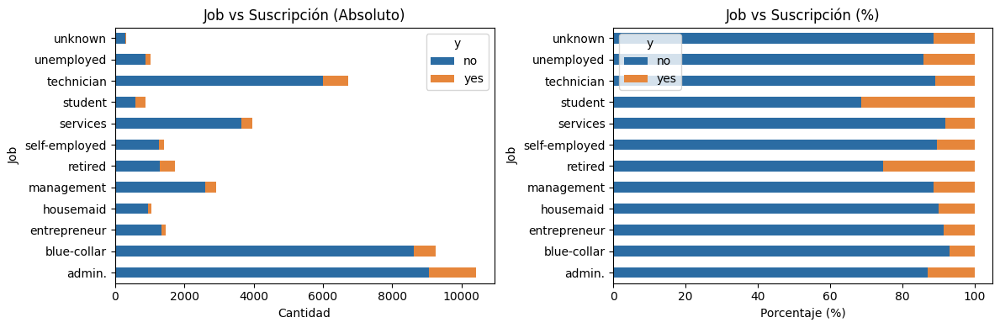

In [44]:
var = 'job'  # Cambia aquí para analizar otra variable

# Tabla absoluta y porcentaje
tabla_abs = df.groupby([var, 'y']).size().unstack(fill_value=0)
tabla_pct = tabla_abs.div(tabla_abs.sum(axis=1), axis=0) * 100

# Define colores personalizados (azul y naranja)
colores = ['#2B6CA3', '#E6863B']  # azul, naranja (puedes cambiar los hex si prefieres otros tonos)

fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(12, 4))

# Gráfico absoluto
tabla_abs.plot(kind='barh', stacked=True, color=colores, ax=axes[0])
axes[0].set_title(f"{var.capitalize()} vs Suscripción (Absoluto)")
axes[0].set_xlabel("Cantidad")
axes[0].set_ylabel(var.capitalize())

# Gráfico porcentaje
tabla_pct.plot(kind='barh', stacked=True, color=colores, ax=axes[1])
axes[1].set_title(f"{var.capitalize()} vs Suscripción (%)")
axes[1].set_xlabel("Porcentaje (%)")
axes[1].set_ylabel(var.capitalize())

plt.tight_layout()
plt.show()

JOB: Los grupos de mayor tamaño son administrativos y obreros (administracion es la tercera mejor conversión). Sin embargo, los grupos más pequeños  convierten mejor: “student”, “retired” y “unemployed”.

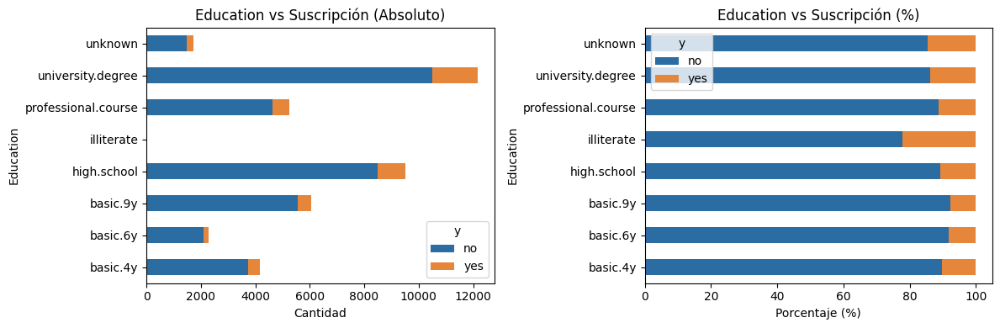

In [45]:
var = 'education'  # Cambia aquí para analizar otra variable

# Tabla absoluta y porcentaje
tabla_abs = df.groupby([var, 'y']).size().unstack(fill_value=0)
tabla_pct = tabla_abs.div(tabla_abs.sum(axis=1), axis=0) * 100

# Define colores personalizados (azul y naranja)
colores = ['#2B6CA3', '#E6863B']  # azul, naranja (puedes cambiar los hex si prefieres otros tonos)

fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(12, 4))

# Gráfico absoluto
tabla_abs.plot(kind='barh', stacked=True, color=colores, ax=axes[0])
axes[0].set_title(f"{var.capitalize()} vs Suscripción (Absoluto)")
axes[0].set_xlabel("Cantidad")
axes[0].set_ylabel(var.capitalize())

# Gráfico porcentaje
tabla_pct.plot(kind='barh', stacked=True, color=colores, ax=axes[1])
axes[1].set_title(f"{var.capitalize()} vs Suscripción (%)")
axes[1].set_xlabel("Porcentaje (%)")
axes[1].set_ylabel(var.capitalize())

plt.tight_layout()
plt.show()

EDUCATION: Personas con estudios universitarios son los que tienen mayor volumen y 2da mejor conversión!  Analfabetos (grupo extremadamente pequeño) tienen mejor tasa.

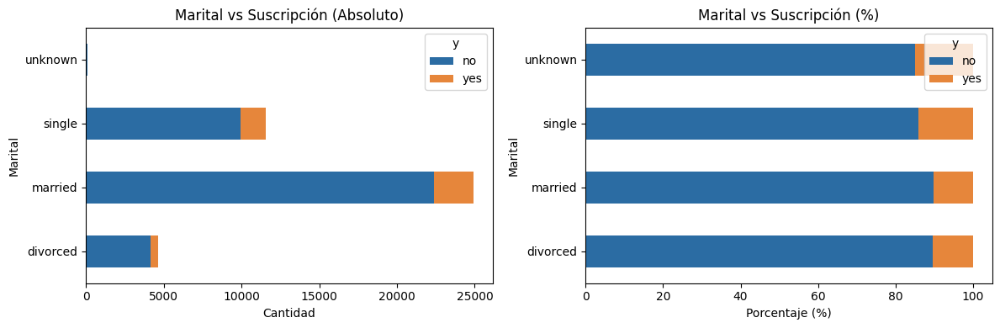

In [46]:
var = 'marital'  # Cambia aquí para analizar otra variable

# Tabla absoluta y porcentaje
tabla_abs = df.groupby([var, 'y']).size().unstack(fill_value=0)
tabla_pct = tabla_abs.div(tabla_abs.sum(axis=1), axis=0) * 100

# Define colores personalizados (azul y naranja)
colores = ['#2B6CA3', '#E6863B']  # azul, naranja (puedes cambiar los hex si prefieres otros tonos)

fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(12, 4))

# Gráfico absoluto
tabla_abs.plot(kind='barh', stacked=True, color=colores, ax=axes[0])
axes[0].set_title(f"{var.capitalize()} vs Suscripción (Absoluto)")
axes[0].set_xlabel("Cantidad")
axes[0].set_ylabel(var.capitalize())

# Gráfico porcentaje
tabla_pct.plot(kind='barh', stacked=True, color=colores, ax=axes[1])
axes[1].set_title(f"{var.capitalize()} vs Suscripción (%)")
axes[1].set_xlabel("Porcentaje (%)")
axes[1].set_ylabel(var.capitalize())

plt.tight_layout()
plt.show()

MARITAL: Solteros y divorciados convierten algo más que casados sin que ser una diferencia relevante.

### Variables categoricas financieras

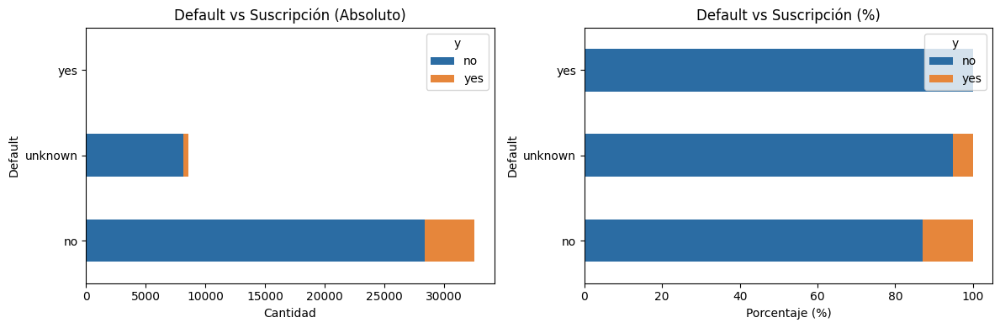

In [47]:
var = 'default'  # Cambia aquí para analizar otra variable

# Tabla absoluta y porcentaje
tabla_abs = df.groupby([var, 'y']).size().unstack(fill_value=0)
tabla_pct = tabla_abs.div(tabla_abs.sum(axis=1), axis=0) * 100

# Define colores personalizados (azul y naranja)
colores = ['#2B6CA3', '#E6863B']  # azul, naranja (puedes cambiar los hex si prefieres otros tonos)

fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(12, 4))

# Gráfico absoluto
tabla_abs.plot(kind='barh', stacked=True, color=colores, ax=axes[0])
axes[0].set_title(f"{var.capitalize()} vs Suscripción (Absoluto)")
axes[0].set_xlabel("Cantidad")
axes[0].set_ylabel(var.capitalize())

# Gráfico porcentaje
tabla_pct.plot(kind='barh', stacked=True, color=colores, ax=axes[1])
axes[1].set_title(f"{var.capitalize()} vs Suscripción (%)")
axes[1].set_xlabel("Porcentaje (%)")
axes[1].set_ylabel(var.capitalize())

plt.tight_layout()
plt.show()

DEFAULT: Clientes con mora prácticamente no convierten. Unknown es un misterio ya que tiene una conversión aceptable.

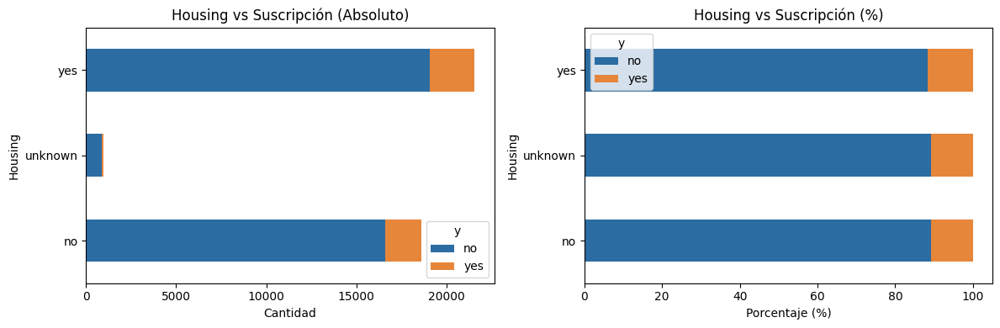

In [48]:
var = 'housing'  # Cambia aquí para analizar otra variable

# Tabla absoluta y porcentaje
tabla_abs = df.groupby([var, 'y']).size().unstack(fill_value=0)
tabla_pct = tabla_abs.div(tabla_abs.sum(axis=1), axis=0) * 100

# Define colores personalizados (azul y naranja)
colores = ['#2B6CA3', '#E6863B']  # azul, naranja (puedes cambiar los hex si prefieres otros tonos)

fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(12, 4))

# Gráfico absoluto
tabla_abs.plot(kind='barh', stacked=True, color=colores, ax=axes[0])
axes[0].set_title(f"{var.capitalize()} vs Suscripción (Absoluto)")
axes[0].set_xlabel("Cantidad")
axes[0].set_ylabel(var.capitalize())

# Gráfico porcentaje
tabla_pct.plot(kind='barh', stacked=True, color=colores, ax=axes[1])
axes[1].set_title(f"{var.capitalize()} vs Suscripción (%)")
axes[1].set_xlabel("Porcentaje (%)")
axes[1].set_ylabel(var.capitalize())

plt.tight_layout()
plt.show()

HOUSING: Muy Leve mayor conversión en quienes no tienen hipoteca. No importa tanto si tiene o no hipoteca.

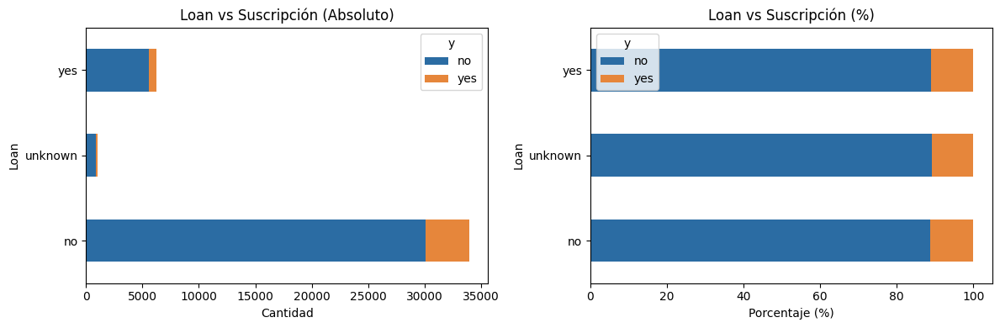

In [49]:
var = 'loan'  # Cambia aquí para analizar otra variable

# Tabla absoluta y porcentaje
tabla_abs = df.groupby([var, 'y']).size().unstack(fill_value=0)
tabla_pct = tabla_abs.div(tabla_abs.sum(axis=1), axis=0) * 100

# Define colores personalizados (azul y naranja)
colores = ['#2B6CA3', '#E6863B']  # azul, naranja (puedes cambiar los hex si prefieres otros tonos)

fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(12, 4))

# Gráfico absoluto
tabla_abs.plot(kind='barh', stacked=True, color=colores, ax=axes[0])
axes[0].set_title(f"{var.capitalize()} vs Suscripción (Absoluto)")
axes[0].set_xlabel("Cantidad")
axes[0].set_ylabel(var.capitalize())

# Gráfico porcentaje
tabla_pct.plot(kind='barh', stacked=True, color=colores, ax=axes[1])
axes[1].set_title(f"{var.capitalize()} vs Suscripción (%)")
axes[1].set_xlabel("Porcentaje (%)")
axes[1].set_ylabel(var.capitalize())

plt.tight_layout()
plt.show()

LOAN: Leve mayor conversión en quienes no tienen prestamos personal. Sin embargo no importa tanto si tiene o no credito personal.

### Variables categoricas de campaña

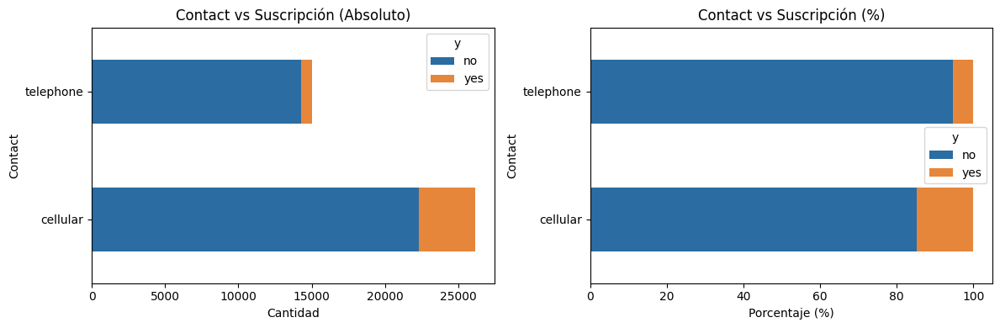

In [50]:
var = 'contact'  # Cambia aquí para analizar otra variable

# Tabla absoluta y porcentaje
tabla_abs = df.groupby([var, 'y']).size().unstack(fill_value=0)
tabla_pct = tabla_abs.div(tabla_abs.sum(axis=1), axis=0) * 100

# Define colores personalizados (azul y naranja)
colores = ['#2B6CA3', '#E6863B']  # azul, naranja (puedes cambiar los hex si prefieres otros tonos)

fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(12, 4))

# Gráfico absoluto
tabla_abs.plot(kind='barh', stacked=True, color=colores, ax=axes[0])
axes[0].set_title(f"{var.capitalize()} vs Suscripción (Absoluto)")
axes[0].set_xlabel("Cantidad")
axes[0].set_ylabel(var.capitalize())

# Gráfico porcentaje
tabla_pct.plot(kind='barh', stacked=True, color=colores, ax=axes[1])
axes[1].set_title(f"{var.capitalize()} vs Suscripción (%)")
axes[1].set_xlabel("Porcentaje (%)")
axes[1].set_ylabel(var.capitalize())

plt.tight_layout()
plt.show()

CONTACT: Contacto por celular es mucho más efectivo que por teléfono fijo.

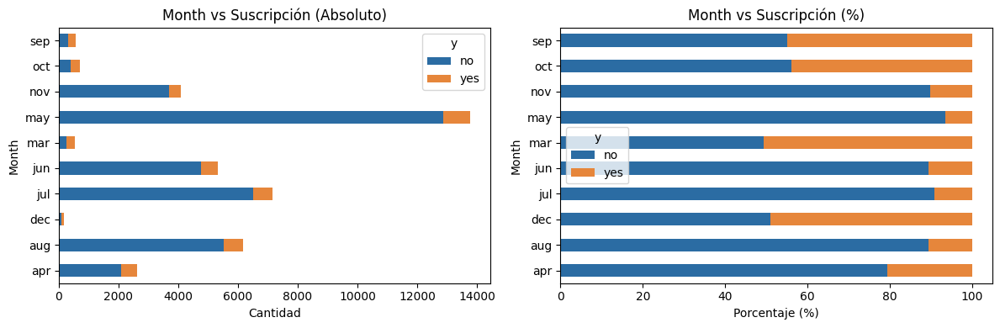

In [51]:
var = 'month'  # Cambia aquí para analizar otra variable

# Tabla absoluta y porcentaje
tabla_abs = df.groupby([var, 'y']).size().unstack(fill_value=0)
tabla_pct = tabla_abs.div(tabla_abs.sum(axis=1), axis=0) * 100

# Define colores personalizados (azul y naranja)
colores = ['#2B6CA3', '#E6863B']  # azul, naranja (puedes cambiar los hex si prefieres otros tonos)

fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(12, 4))

# Gráfico absoluto
tabla_abs.plot(kind='barh', stacked=True, color=colores, ax=axes[0])
axes[0].set_title(f"{var.capitalize()} vs Suscripción (Absoluto)")
axes[0].set_xlabel("Cantidad")
axes[0].set_ylabel(var.capitalize())

# Gráfico porcentaje
tabla_pct.plot(kind='barh', stacked=True, color=colores, ax=axes[1])
axes[1].set_title(f"{var.capitalize()} vs Suscripción (%)")
axes[1].set_xlabel("Porcentaje (%)")
axes[1].set_ylabel(var.capitalize())

plt.tight_layout()
plt.show()

MONTH: las mejores conversiones se dan en meses que no hay volumen de datos. EL volumen de llamadas se da entre Mayo a Agosto.

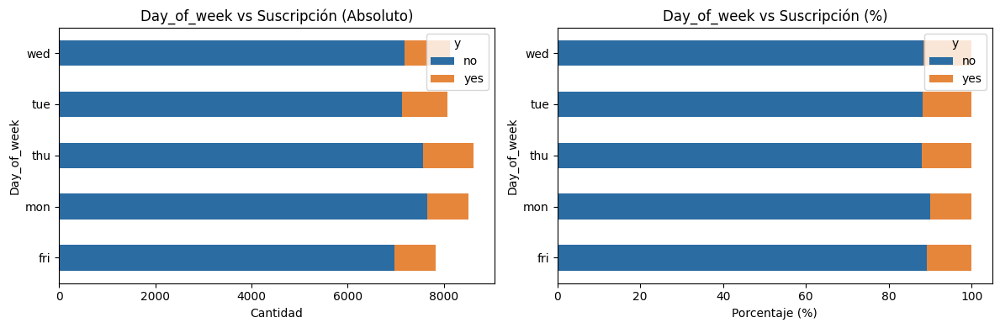

In [52]:
var = 'day_of_week'  # Cambia aquí para analizar otra variable

# Tabla absoluta y porcentaje
tabla_abs = df.groupby([var, 'y']).size().unstack(fill_value=0)
tabla_pct = tabla_abs.div(tabla_abs.sum(axis=1), axis=0) * 100

# Define colores personalizados (azul y naranja)
colores = ['#2B6CA3', '#E6863B']  # azul, naranja (puedes cambiar los hex si prefieres otros tonos)

fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(12, 4))

# Gráfico absoluto
tabla_abs.plot(kind='barh', stacked=True, color=colores, ax=axes[0])
axes[0].set_title(f"{var.capitalize()} vs Suscripción (Absoluto)")
axes[0].set_xlabel("Cantidad")
axes[0].set_ylabel(var.capitalize())

# Gráfico porcentaje
tabla_pct.plot(kind='barh', stacked=True, color=colores, ax=axes[1])
axes[1].set_title(f"{var.capitalize()} vs Suscripción (%)")
axes[1].set_xlabel("Porcentaje (%)")
axes[1].set_ylabel(var.capitalize())

plt.tight_layout()
plt.show()

DAY_OF_WEEK: Intracendente

POUTCOME: Si campaña anterior fue “success”, hay muchísima más conversión, sin embargo es una base muy pequeña.

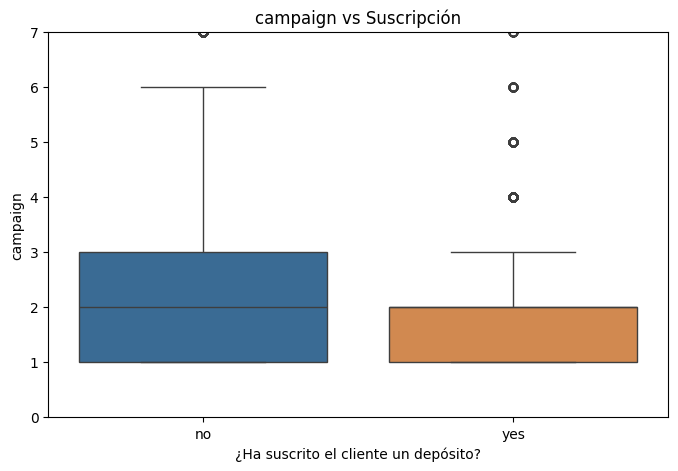

In [53]:
# Cambia aquí la variable que quieres analizar
var = 'campaign'  # Por ejemplo: 'campaign', 'duration', 'pdays', etc.

# Convertir y a variable binaria (si no está hecho ya)
#df['y_numeric'] = df['y'].map({'no': 0, 'yes': 1})

plt.figure(figsize=(8, 5))
sns.boxplot(x='y', y=var, data=df, palette=['#2B6CA3', '#E6863B'])
plt.title(f'{var} vs Suscripción')
plt.xlabel('¿Ha suscrito el cliente un depósito?')
plt.ylabel(var)
plt.ylim(0,7)
plt.show()

CAMPAIGN: Más de 3 contactos reducen la probabilidad de conversión.

### Variables númericas demográficas

#### Transformacion de variable Age en Categorica por medio de bins arbitrarios

In [54]:
# Crear grupos de edad
bins = [0, 25, 35, 45, 55, 65, 100]
labels = ['<25', '25-35', '35-45', '45-55', '55-65', '65+'] #intervalos
df['age_group'] = pd.cut(df['age'], bins=bins, labels=labels, right=False)

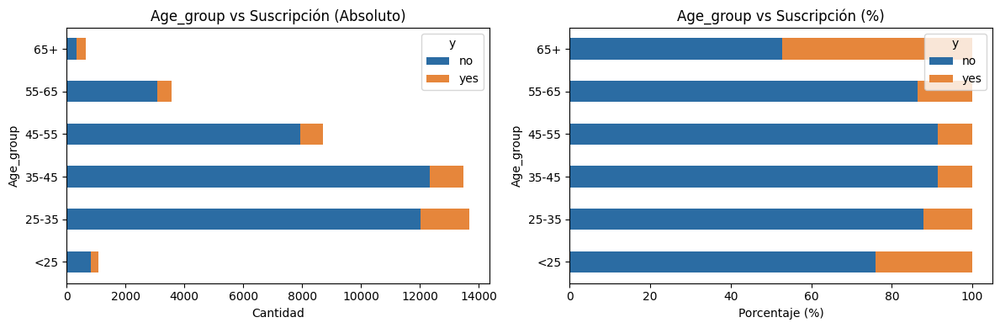

In [55]:
var = 'age_group'  # Cambia a cualquier columna categórica

# Calcula tablas absolutas y porcentajes
tabla_abs = df.groupby([var, 'y']).size().unstack(fill_value=0)
tabla_pct = tabla_abs.div(tabla_abs.sum(axis=1), axis=0) * 100

# Define tus colores personalizados: azul y naranja
colores = ['#2B6CA3', '#E6863B']

fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(12, 4))

# Gráfico absoluto
tabla_abs.plot(kind='barh', stacked=True, color=colores, ax=axes[0])
axes[0].set_title(f"{var.capitalize()} vs Suscripción (Absoluto)")
axes[0].set_xlabel("Cantidad")
axes[0].set_ylabel(var.capitalize())

# Gráfico porcentaje
tabla_pct.plot(kind='barh', stacked=True, color=colores, ax=axes[1])
axes[1].set_title(f"{var.capitalize()} vs Suscripción (%)")
axes[1].set_xlabel("Porcentaje (%)")
axes[1].set_ylabel(var.capitalize())

plt.tight_layout()
plt.show()

AGE: Segmento <25 y >65 tienen excelentes conversiones pero el tamaño del segmento es bastante reducido. El segmento 25-35 es interesante ya que es el de mayor tamaño y su conversión es mayor a los otros >25 y <65

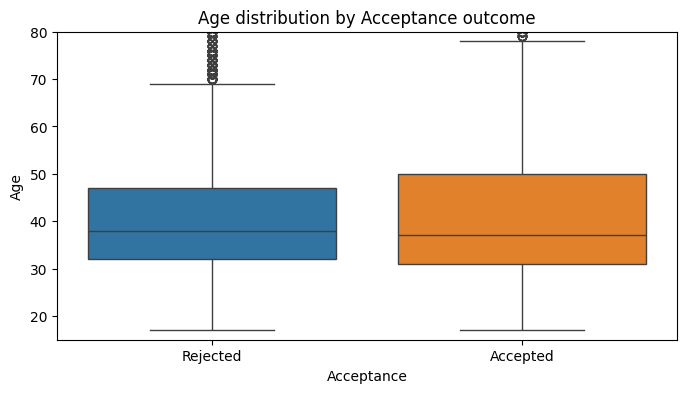

Age distribution by Acceptance outcome: 
       count       mean        std   min   25%   50%   75%   max
y                                                               
no   36537.0  39.910994   9.897176  17.0  32.0  38.0  47.0  95.0
yes   4639.0  40.912266  13.838838  17.0  31.0  37.0  50.0  98.0


In [56]:
plt.figure(figsize=(8, 4))
sns.boxplot(x='y', y='age', data=df , hue='y')
plt.xlabel('Acceptance')
plt.ylabel('Age')
plt.title('Age distribution by Acceptance outcome')
plt.xticks([0, 1], ['Rejected', 'Accepted'])  # Rename the x-axis labels
plt.ylim(15,80)
plt.show()

print(f'Age distribution by Acceptance outcome: \n{df.groupby("y")["age"].describe()}')

### Variables númericas de campaña

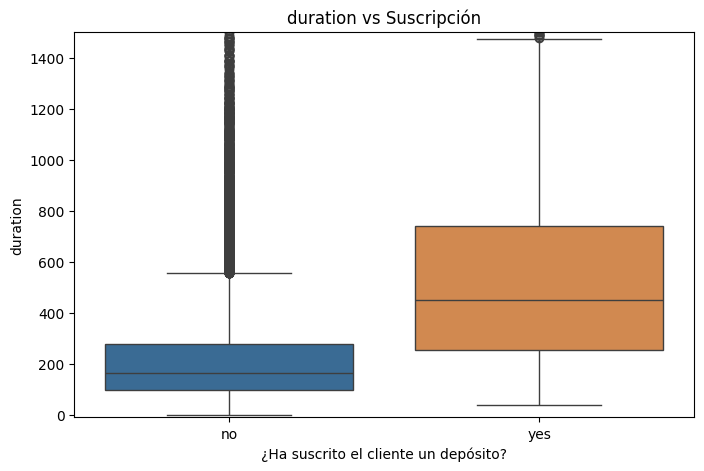

In [57]:
# Cambia aquí la variable que quieres analizar
var = 'duration'  # Por ejemplo: 'campaign', 'duration', 'pdays', etc.

# Convertir y a variable binaria (si no está hecho ya)
df['y_numeric'] = df['y'].map({'no': 0, 'yes': 1})

plt.figure(figsize=(8, 5))
sns.boxplot(x='y', y=var, data=df, palette=['#2B6CA3', '#E6863B'])
plt.title(f'{var} vs Suscripción')
plt.xlabel('¿Ha suscrito el cliente un depósito?')

plt.ylabel(var)
plt.ylim(-10,1500)
plt.show()

DURATION: Es el mejor predictor: contactos largos tienden a ser exitosos.

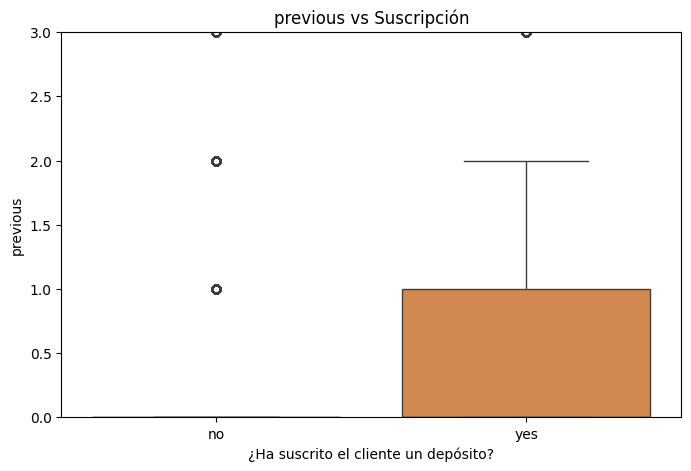

In [58]:
import matplotlib.ticker as tck


# Cambia aquí la variable que quieres analizar
var = 'previous'  # Por ejemplo: 'campaign', 'duration', 'pdays', etc.

# Convertir y a variable binaria (si no está hecho ya)
df['y_numeric'] = df['y'].map({'no': 0, 'yes': 1})

plt.figure(figsize=(8, 5))
sns.boxplot(x='y', y=var, data=df, palette=['#2B6CA3', '#E6863B'])
plt.title(f'{var} vs Suscripción')
plt.xlabel('¿Ha suscrito el cliente un depósito?')
plt.ylabel(var)
plt.ylim(0,3)

plt.show()

PREVIOUS: Más interacciones pasadas se correlacionan con mayor conversión.

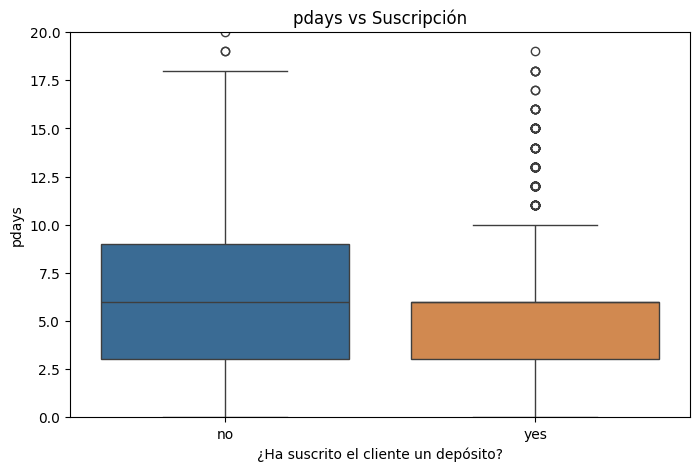

In [59]:
# Cambia aquí la variable que quieres analizar
var = 'pdays'  # Por ejemplo: 'campaign', 'duration', 'pdays', etc.

# Convertir y a variable binaria (si no está hecho ya)
df['y_numeric'] = df['y'].map({'no': 0, 'yes': 1})

plt.figure(figsize=(8, 5))
sns.boxplot(x='y', y=var, data=df, palette=['#2B6CA3', '#E6863B'])
plt.title(f'{var} vs Suscripción')
plt.xlabel('¿Ha suscrito el cliente un depósito?')
plt.ylabel(var)
plt.ylim(0,20)
plt.show()

pdays el 96% de la base tiene 999 días (imputado como NaN). Solo el 4% de la base ha sido contactada antes de los cuales un 2% tiene contacto entre 1 y 2 días, con buenos resultados. Se recomienda eliminar en esta grafica el outlier 999 para tener una mejor visión.Conlcusión: Contactos recientes (bajo pdays) muestran más probabilidad de éxito. Sin embargo el número es muy pequeño.

### Variables númericas económicas

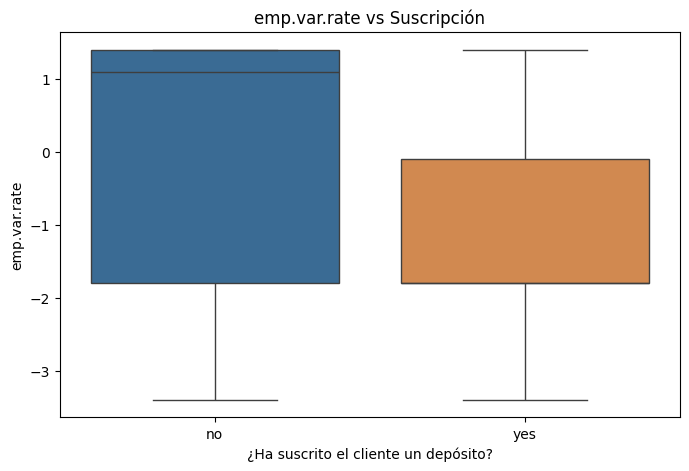

In [60]:
# Cambia aquí la variable que quieres analizar
var = 'emp.var.rate'  # Por ejemplo: 'campaign', 'duration', 'pdays', etc.

# Convertir y a variable binaria (si no está hecho ya)
df['y_numeric'] = df['y'].map({'no': 0, 'yes': 1})

plt.figure(figsize=(8, 5))
sns.boxplot(x='y', y=var, data=df, palette=['#2B6CA3', '#E6863B'])
plt.title(f'{var} vs Suscripción')
plt.xlabel('¿Ha suscrito el cliente un depósito?')
plt.ylabel(var)
plt.show()

EMP.VAR.RATE: Tasa negativa de empleo muestra más conversiones (probable efecto crisis).

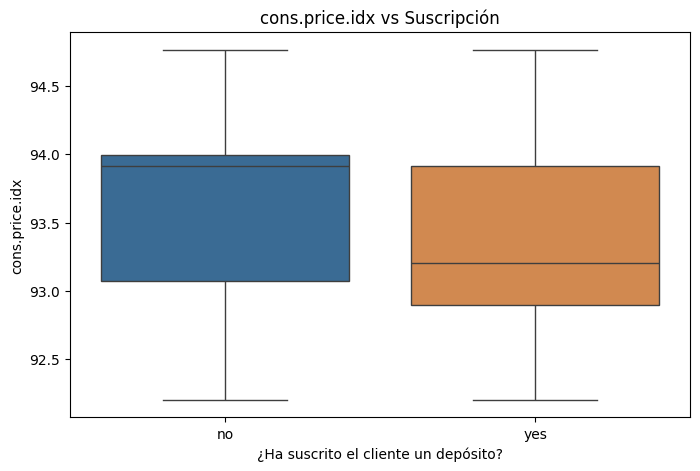

In [61]:
# Cambia aquí la variable que quieres analizar
var = 'cons.price.idx'  # Por ejemplo: 'campaign', 'duration', 'pdays', etc.

# Convertir y a variable binaria (si no está hecho ya)
df['y_numeric'] = df['y'].map({'no': 0, 'yes': 1})

plt.figure(figsize=(8, 5))
sns.boxplot(x='y', y=var, data=df, palette=['#2B6CA3', '#E6863B'])
plt.title(f'{var} vs Suscripción')
plt.xlabel('¿Ha suscrito el cliente un depósito?')
plt.ylabel(var)
plt.show()

CONS.PRICE.IDXC: Leve influencia: valores más bajos tienden a más conversiones.

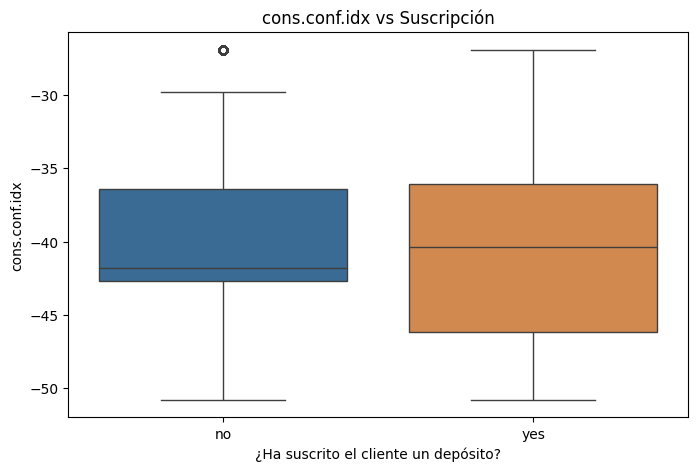

In [62]:
# Cambia aquí la variable que quieres analizar
var = 'cons.conf.idx'  # Por ejemplo: 'campaign', 'duration', 'pdays', etc.

# Convertir y a variable binaria (si no está hecho ya)
df['y_numeric'] = df['y'].map({'no': 0, 'yes': 1})

plt.figure(figsize=(8, 5))
sns.boxplot(x='y', y=var, data=df, palette=['#2B6CA3', '#E6863B'])
plt.title(f'{var} vs Suscripción')
plt.xlabel('¿Ha suscrito el cliente un depósito?')
plt.ylabel(var)
plt.show()

CONS.CONF.IDX: Índice negativo (baja confianza) coincide con más depósitos.

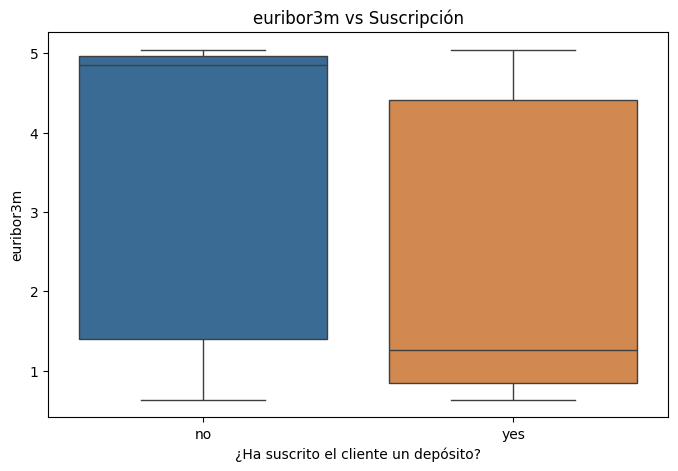

In [63]:
# Cambia aquí la variable que quieres analizar
var = 'euribor3m'  # Por ejemplo: 'campaign', 'duration', 'pdays', etc.

# Convertir y a variable binaria (si no está hecho ya)
df['y_numeric'] = df['y'].map({'no': 0, 'yes': 1})

plt.figure(figsize=(8, 5))
sns.boxplot(x='y', y=var, data=df, palette=['#2B6CA3', '#E6863B'])
plt.title(f'{var} vs Suscripción')
plt.xlabel('¿Ha suscrito el cliente un depósito?')
plt.ylabel(var)
plt.show()

EURIBOR3M: Valores bajos del Euribor (0.6–1.0) tienen más éxito.

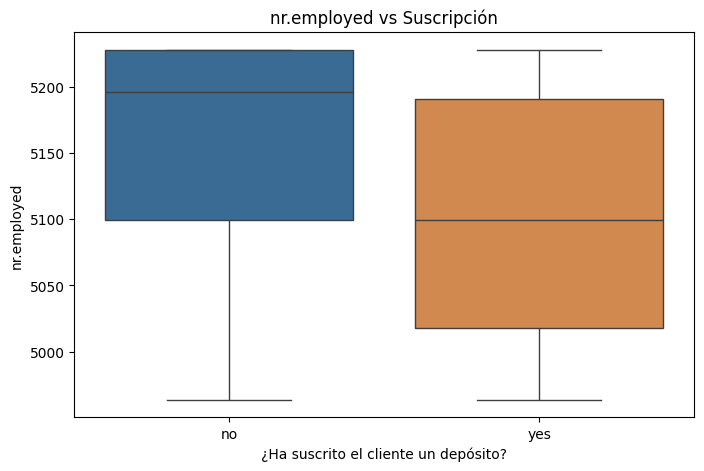

In [64]:
# Cambia aquí la variable que quieres analizar
var = 'nr.employed'  # Por ejemplo: 'campaign', 'duration', 'pdays', etc.

# Convertir y a variable binaria (si no está hecho ya)
df['y_numeric'] = df['y'].map({'no': 0, 'yes': 1})

plt.figure(figsize=(8, 5))
sns.boxplot(x='y', y=var, data=df, palette=['#2B6CA3', '#E6863B'])
plt.title(f'{var} vs Suscripción')
plt.xlabel('¿Ha suscrito el cliente un depósito?')
plt.ylabel(var)
plt.show()

NR.EMPLOYED: Fewer empleados (más paro) pueden coincidir con más conversión.

In [65]:
df.head()

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,duration,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y,was_previously_contacted,age_group,y_numeric
0,56,housemaid,married,basic.4y,no,no,no,telephone,may,mon,261,1,NaN,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no,0,55-65,0
1,57,services,married,high.school,unknown,no,no,telephone,may,mon,149,1,NaN,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no,0,55-65,0
2,37,services,married,high.school,no,yes,no,telephone,may,mon,226,1,NaN,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no,0,35-45,0
3,40,admin.,married,basic.6y,no,no,no,telephone,may,mon,151,1,NaN,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no,0,35-45,0
4,56,services,married,high.school,no,no,yes,telephone,may,mon,307,1,NaN,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no,0,55-65,0


### Mapa de correlaciones por clase de variables (demograficas, financieras, de campaña y economicas)

In [66]:

for col in df.select_dtypes(include=['bool']).columns:
    df[col] = df[col].astype(int)


dict_attrib_class={'demograficas':['age','job','marital','education','y'],
                   'financieras':['default','housing','loan','y'],
                   'campaña':['contact','month','day_of_week','duration','campaign','pdays','previous','poutcome','y'],
                   'economicas':['emp.var.rate',	'cons.price.idx',	'cons.conf.idx',	'euribor3m',	'nr.employed'	,'y']}

for k,v in dict_attrib_class.items():
  print(k.upper())

  # Convert categorical variables to numerical (using target/mean encoding)
  # Alternatively, you can use one-hot encoding, but that increases dimensions
  target = 'y'  # you can set to another column if desired
  df_encoded = df[v]

  for col in df[v].select_dtypes(include='object').columns:
      if col != target:
          df_encoded[col] = df_encoded.groupby(col)[target].transform(lambda x: x.map({'yes': 1, 'no': 0}).mean())

  # Encode target column last
  df_encoded[target] = df_encoded[target].map({'yes': 1, 'no': 0})


  # Now calculate correlations
  df_corr = df_encoded.corr()

  # Mask
  mask = np.zeros_like(df_corr, dtype=bool)
  mask[np.triu_indices_from(mask)] = True

  # Viz
  df_corr_viz = df_corr.mask(mask)#.dropna(how='all').dropna('columns', how='all')

  # Plot using Plotly
  fig = px.imshow(
      df_corr_viz,
      text_auto='.2f',
      color_continuous_scale='RdBu_r',
      title=f'Mapa de correlaciones de variables {k.upper()}',
      aspect='auto',
      zmin=-1,
      zmax=1
  )
  fig.show()

DEMOGRAFICAS


FINANCIERAS


CAMPAÑA


ECONOMICAS


In [67]:
'''
import plotly.express as px
var_financieras = ["default", "loan", "housing" ]

df_ = df[["y"] + var_financieras].melt(id_vars="y")

fig = px.box(
    data_frame=df_,
    x="y",
    y="value",
    color="y",
    facet_col="variable",
    facet_col_spacing=0.005,
)
fig.show()
'''

'\nimport plotly.express as px\nvar_financieras = ["default", "loan", "housing" ]\n\ndf_ = df[["y"] + var_financieras].melt(id_vars="y")\n\nfig = px.box(\n    data_frame=df_,\n    x="y",\n    y="value",\n    color="y",\n    facet_col="variable",\n    facet_col_spacing=0.005,\n)\nfig.show()\n'

### Perfil del suscriptor medio

Hombre o mujer de entre 35 y 50 años, Ha sido contactado una o dos veces (no más), No había sido contactado antes (pdays = 999, previous = 0), Se le dedicó un tiempo de llamada largo (>= 500 segundos), Fue contactado en meses como marzo, abril u octubre, por móvil, No tiene créditos personales o hipotecarios, Vive en un contexto económico complejo, lo que aumentó su interés por depósitos seguros.

In [68]:
# Subconjunto de suscriptores
df_yes = df[df['y'] == 'yes'].copy()#.drop(columns=['y', 'default', 'housing', 'loan'])

# Perfil medio
#perfil_suscriptor = df_yes.describe(include='all').T
#display(perfil_suscriptor)

#exploracion_inicial(df_yes)
#df_yes.describe()

In [69]:
#type(df_yes)
df_yes.sample(25)

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,duration,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y,was_previously_contacted,age_group,y_numeric
17291,46,student,single,unknown,no,yes,no,telephone,jul,fri,279,4,NaN,0,nonexistent,1.4,93.918,-42.7,4.962,5228.1,yes,0,45-55,1
37492,46,technician,married,basic.6y,no,yes,no,cellular,aug,thu,464,4,NaN,0,nonexistent,-2.9,92.201,-31.4,0.873,5076.2,yes,0,45-55,1
29828,31,admin.,single,university.degree,no,yes,yes,cellular,apr,mon,885,5,NaN,1,failure,-1.8,93.075,-47.1,1.405,5099.1,yes,0,25-35,1
3436,44,services,married,high.school,unknown,yes,no,telephone,may,thu,1263,2,NaN,0,nonexistent,1.1,93.994,-36.4,4.860,5191.0,yes,0,35-45,1
36013,27,student,single,high.school,no,yes,yes,cellular,may,tue,91,1,NaN,0,nonexistent,-1.8,92.893,-46.2,1.266,5099.1,yes,0,25-35,1
36976,50,admin.,married,university.degree,no,yes,no,cellular,jul,thu,567,5,NaN,0,nonexistent,-2.9,92.469,-33.6,1.072,5076.2,yes,0,45-55,1
30017,23,admin.,single,university.degree,no,no,no,cellular,apr,wed,341,2,NaN,0,nonexistent,-1.8,93.075,-47.1,1.405,5099.1,yes,0,<25,1
24327,40,admin.,married,university.degree,unknown,no,no,cellular,nov,mon,890,1,NaN,0,nonexistent,-0.1,93.200,-42.0,4.191,5195.8,yes,0,35-45,1
35233,21,student,single,high.school,unknown,no,no,cellular,may,fri,885,3,NaN,0,nonexistent,-1.8,92.893,-46.2,1.250,5099.1,yes,0,<25,1
39024,29,unemployed,married,basic.4y,no,no,no,telephone,dec,thu,805,1,NaN,0,nonexistent,-3.0,92.713,-33.0,0.714,5023.5,yes,0,25-35,1


In [70]:
df_yes.select_dtypes(include='object').mode()

,job,marital,education,default,housing,loan,contact,month,day_of_week,poutcome,y
0,admin.,married,university.degree,no,yes,no,cellular,may,thu,nonexistent,yes


In [71]:
df_yes.select_dtypes(include=['int','float']).median()

,0
age,37.000
duration,449.000
campaign,2.000
pdays,6.000
previous,0.000
emp.var.rate,-1.800
cons.price.idx,93.200
cons.conf.idx,-40.400
euribor3m,1.266
nr.employed,5099.100


PERFIL DEL SUSCRIPTOR POR CLASE DE VARIABLE:
- Demograficas:
  - Edad **37 años**
  - Trabajo **administrativo**
  - Estado civil **casado**
  - Nivel educativo **universitario**
- Financieras:
  - Default **no**
  - Hipoteca **si**
  - Loan **no**
- Campaña:
  - Contacto via **celular**
  - Dia de contacto **jueves**
  - Mes de contacto **mayo**
  - Contacto previo **no**, >96% de los clientes no fueron contactados en la campaña anterior
  - En caso de contacto previo, dias transcurridos: **6**
  - Contactos totales: **2**
  - Duracion de contacto con aceptacion: **449 segundos** (~7.5 min)
- Economicas:
  - Employment variation rate **-1.8** (decremento en cantidad de personas empleadas)
  - Number employees: **5,099**
  - Consumer price index: **93.2** (incremento en costo de canasta basica y servicios)
  - Consumer confidence index: **-40.4** (ambiente financieramente pesimista entre consumidores)
  - Euribor a 3 meses: **1.266** (tasa de referencia de prestamos interbancarios en Eurozona. 1.266 es una tasa baja)


Perfil del NO suscriptor, para contrastar con el perfil anterior e identificar variables que definen un perfil o si se repiten en ambos perfiles debido al dominio estadistico de tales variables.

In [72]:
df_no = df[df['y'] == 'no'].copy()

In [73]:
df_no.select_dtypes(include='object').mode()

,job,marital,education,default,housing,loan,contact,month,day_of_week,poutcome,y
0,admin.,married,university.degree,no,yes,no,cellular,may,mon,nonexistent,no


In [74]:
df_no.select_dtypes(include=['int','float']).median()

,0
age,38.000
duration,164.000
campaign,2.000
pdays,6.000
previous,0.000
emp.var.rate,1.100
cons.price.idx,93.918
cons.conf.idx,-41.800
euribor3m,4.857
nr.employed,5195.800


PERFIL DEL NO SUSCRIPTOR POR CLASE DE VARIABLE:

- Demograficas:
  - Edad **38 años** (~ suscriptor)
  - Trabajo **administrativo** (= suscriptor)
  - Estado civil **casado** (= suscriptor)
  - Nivel educativo **universitario** (= suscriptor)
- Financieras:
  - Default **no** (= suscriptor)
  - Hipoteca **si** (= suscriptor)
  - Loan **no** (= suscriptor)
- Campaña:
  - Contacto via **celular** (= suscriptor)
  - Dia de contacto **lunes** **(!= suscriptor)**
  - Mes de contacto **mayo** (= suscriptor)
  - Contacto previo **no**, >96% de los clientes no fueron contactados en la campaña anterior
  - En caso de contacto previo, dias transcurridos: **6** (= suscriptor)
  - Contactos totales: **2** (= suscriptor)
  - Duracion de ultimo contacto: **164 segundos (~2.7 min, muy distinto a suscriptor)**
- Economicas:
  - Employment variation rate **1.8** **(incremento en cantidad de personas empleadas, opuesto a la situacion del suscriptor)**
  - Number employees: **5,195**
  - Consumer price index: **93.9** (incremento en costo de canasta basica y servicios, ~ suscriptor)
  - Consumer confidence index: **-41.8** (ambiente financieramente pesimista entre consumidores, ~ suscriptor)
  - Euribor a 3 meses: **4.857 (tasa de referencia de prestamos interbancarios en Eurozona. la tasa es x3.8 la tasa del suscriptor)**

ATRIBUTOS DEFINITORIOS DEL PERFIL DEL SUSCRIPTOR:
- Las variables de clase **demograficas** y **financieras** no definen al suscriptor medio sino que se ven dominadas estadisticamente por el perfil medio de cliente actual (independientemente de si es suscriptor o no). Mediante el analisis bivariable se puede proponer la busqueda de perfiles de cliente distintos.
- Las variables de clase **campaña** que pueden ser relevantes son el dia de la semana (en lunes el cliente no contrata, el jueves parece estar mas abierto a escuchar la oferta) y sobre todo la duracion del contacto que debe estar mas cercano a los 7.5 min  que a los 2.7 min.
- Las variables de clase **economica**, si bien no son realmente parte del perfil del cliente, si definen la situacion economica en la que mas clientes (con el mismo perfil) contratan prestamos. Las variables definitorias son **employment variation rate** y **euribor3m** donde los valores negativo y menor, respectivamente, reflejan que el cliente medio es mas susceptible a contratar dentro de un ambiente de baja en empleabilidad y tasas de referencia igualmente bajas, que es algo esperado pero que queda comprobado segun nuestra analisis.

## Modelo de regresion logistica

In [75]:
df.columns

Index(['age', 'job', 'marital', 'education', 'default', 'housing', 'loan',
       'contact', 'month', 'day_of_week', 'duration', 'campaign', 'pdays',
       'previous', 'poutcome', 'emp.var.rate', 'cons.price.idx',
       'cons.conf.idx', 'euribor3m', 'nr.employed', 'y',
       'was_previously_contacted', 'age_group', 'y_numeric'],
      dtype='object')

In [76]:
# Selección de variables (pre contacto)

#features= list(df.columns)

features = [#'age',
            'job',
            'marital',
            'education',
            'default',
            'housing',
            'loan',
            'contact',
            'month',
            'day_of_week',
            'duration',
            'campaign',
            'pdays',
            'previous',
            'poutcome',
            'emp.var.rate',
            'cons.price.idx',
            'cons.conf.idx',
            'euribor3m',
            'nr.employed',
            #'y',
            'y_bool',
            #'default_bool',
            #'housing_bool',
            #'loan_bool',
            'age_group'
            #'y_numeric'
            ]


'''
features = [
    'age',         # edad
    'job',         # ocupación
    'marital',     # estado civil
    'education',   # nivel educativo
    'default',     # impago en crédito
    'housing',     # préstamo hipotecario
    'loan',        # préstamo personal
    'emp.var.rate',      # Tasa de variación del empleo (numérico)
    'cons.price.idx',    # Índice de precios al consumo (numérico)
    'cons.conf.idx',     # Índice de confianza del consumidor (numérico)
    'euribor3m',         # Tasa del Euribor a 3 meses (numérico)
    'nr.employed'        # Número de empleados (numérico)

]
'''
print(features)


# Transformar variables categóricas a dummies
X = pd.get_dummies(df[features], drop_first=True)
y = df['y']

# Dividir datos en entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

# Guardar dataset de examen
df

# Modelo
model = LogisticRegression(max_iter=1000)
model.fit(X_train, y_train)
y_pred = model.predict(X_test).head()

['job', 'marital', 'education', 'default', 'housing', 'loan', 'contact', 'month', 'day_of_week', 'duration', 'campaign', 'pdays', 'previous', 'poutcome', 'emp.var.rate', 'cons.price.idx', 'cons.conf.idx', 'euribor3m', 'nr.employed', 'y_bool', 'age_group']


KeyError: "['y_bool'] not in index"

**El modelo seleccionado no acepta nans.**

ValueError: Input X contains NaN.
LogisticRegression does not accept missing values encoded as NaN natively. For supervised learning, you might want to consider sklearn.ensemble.HistGradientBoostingClassifier and Regressor which accept missing values encoded as NaNs natively. Alternatively, it is possible to preprocess the data, for instance by using an imputer transformer in a pipeline or drop samples with missing values. See https://scikit-learn.org/stable/modules/impute.html You can find a list of all estimators that handle NaN values at the following page: https://scikit-learn.org/stable/modules/impute.html#estimators-that-handle-nan-values

In [ ]:
# Predicciones de probabilidad
y_proba = model.predict_proba(X_test)[:, 1]

# Nuevo umbral
umbral = 0.3
y_pred_umbral = (y_proba >= umbral).astype(int)

In [ ]:
# Coeficientes del modelo
coefficients = pd.DataFrame(model.coef_.flatten(), index=X.columns, columns=['Coefficient'])
print("Coeficientes del modelo de regresión logística:")
print(coefficients)

intercept = model.intercept_
print(f"Intercept: {intercept}")

#Ordenar por valor absoluto del coeficiente (importancia en la predicción)
top_coef = coefficients.reindex(coefficients['Coefficient'].abs().sort_values(ascending=False).index).head(15)

# Crear gráfico de barras horizontales
plt.figure(figsize=(8, 6))
top_coef['Coefficient'].plot(kind='barh', color=['green' if c > 0 else 'red' for c in top_coef['Coefficient']])
plt.xlabel('Coeficiente')
plt.title('Top 15 variables más importantes (Regresión Logística)')
plt.gca().invert_yaxis()  # Para que la variable más importante quede arriba

In [ ]:
# Métricas de desempeño
print("Accuracy:", accuracy_score(y_test, y_pred))
print("\nReporte de clasificación:")
print(classification_report(y_test, y_pred, target_names=['No Suscribe', 'Suscribe']))

# Matriz de confusión
cm = confusion_matrix(y_test, y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.title("Matriz de Confusión")
plt.xlabel("Predicción")
plt.ylabel("Real")
plt.show()
print(cm)

In [ ]:
plt.hist(model.predict_proba(X_test)[:, 1], bins=30, color='skyblue', edgecolor='black')
plt.title('Distribución de los scores de probabilidad')
plt.xlabel('Score de probabilidad')
plt.ylabel('Cantidad de clientes')
plt.show()

Debido al desbalance del dataset, especificamente de los que suscriben y no suscriben, existe un sesgo al "no suscribed".

In [ ]:
sns.countplot(x=df['y'], palette='Set1')
plt.title('Equilibrio de clases (variable objetivo)')
plt.xlabel('¿Ha suscrito el cliente un depósito?')
plt.ylabel('Cantidad')
plt.show()

Ajuste de pesos: En modelos como LogisticRegression, puedes añadir class_weight='balanced' para que el algoritmo le dé más importancia a los errores cometidos en la clase minoritario

In [ ]:
model = LogisticRegression(max_iter=1000, class_weight='balanced')
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
print(classification_report(y_test, y_pred, target_names=['No Suscribe', 'Suscribe']))

Volvamos a ver la distribucación de las probabilidades luego del ajuste de pesos en el modelo:

In [ ]:
plt.hist(model.predict_proba(X_test)[:, 1], bins=30, color='skyblue', edgecolor='black')
plt.title('Distribución de los scores de probabilidad')
plt.xlabel('Score de probabilidad')
plt.ylabel('Cantidad de clientes')
plt.show()

Nueva matriz de confusión:

In [ ]:
# Matriz de confusión
cm = confusion_matrix(y_test, y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.title("Matriz de Confusión")
plt.xlabel("Predicción")
plt.ylabel("Real")
plt.show()
print(cm)

Generar un scorring para así poder priorizar las llamadas

In [ ]:
# Calcular el score de probabilidad de suscripción para cada cliente
scores = model.predict_proba(X)[:, 1]

# Añadir el score al dataframe original
df['score_suscripcion'] = scores

# Definir percentiles de segmentación (puedes ajustar los umbrales a tu negocio)
df['segmento'] = pd.cut(
    df['score_suscripcion'],
    bins=[-0.01, 0.33, 0.66, 1.0],  # ejemplo: terciles
    labels=['Bajo', 'Medio', 'Alto']
)

# O percentiles reales
# df['segmento'] = pd.qcut(df['score_suscripcion'], q=[0, .2, .8, 1], labels=['Bajo', 'Medio', 'Alto'])

Distribución de los scores en la base:

In [ ]:
plt.figure(figsize=(8,4))
plt.hist(df['score_suscripcion'], bins=30, color='skyblue', edgecolor='black')
plt.title('Distribución del scoring de probabilidad de suscripción')
plt.xlabel('Score de probabilidad')
plt.ylabel('Cantidad de clientes')
plt.show()

Cuantos clientes hay en cada segmento:

In [ ]:
df['segmento'].value_counts().plot(kind='bar', color=['salmon', 'khaki', 'mediumseagreen'])
plt.title('Cantidad de clientes por segmento')
plt.xlabel('Segmento')
plt.ylabel('Número de clientes')
plt.show()

Tasa de conversión por segmento:

In [ ]:
# Si tienes el resultado real de suscripción en df['y_bin']
conversiones = df.groupby('segmento')['y'].agg(['count', 'sum', 'mean'])
conversiones.rename(columns={'count': 'Clientes', 'sum': 'Suscripciones', 'mean': 'Tasa conversión'}, inplace=True)
print(conversiones)

# Visualiza la tasa de conversión por segmento
conversiones['Tasa conversión'].plot(kind='bar', color=['salmon', 'khaki', 'mediumseagreen'])
plt.title('Tasa de conversión por segmento de scoring')
plt.ylabel('Tasa de conversión')
plt.xlabel('Segmento')
plt.ylim(0,1)

plt.show()

Extra analisis: Analizar errores: Vemos falsos negativos en en Age, job, education y en las variables económicas.

In [ ]:
# Encuentra los "suscribe" reales que el modelo NO detectó
falsos_negativos = X_test[(y_test == 1) & (y_pred_umbral == 0)]
print(falsos_negativos.head())

In [ ]:


# Distribución de edades
plt.figure(figsize=(8,4))
plt.hist(X_test.loc[(y_test == 1) & (y_pred_umbral == 0), 'age'], bins=20, alpha=0.7, label='Falsos negativos')
plt.hist(X_test.loc[y_test == 1, 'age'], bins=20, alpha=0.5, label='Todos los Suscribe reales')
plt.title('Edad: Falsos negativos vs. todos los que Suscriben')
plt.xlabel('Edad')
plt.ylabel('Cantidad')
plt.legend()
plt.show()

Los falsos negativos se concentran en los mismos rangos de edad que la mayoría de los “Suscribe” reales, aunque con ligera sobrerrepresentación en los 30-45 años.

In [ ]:
# Supón que tus columnas dummy de trabajo empiezan por 'job_'
trabajos_cols = [col for col in X_test.columns if col.startswith('job_')]
falsos_negativos_jobs = X_test.loc[(y_test == 1) & (y_pred_umbral == 0), trabajos_cols].mean()
todos_suscribe_jobs = X_test.loc[y_test == 1, trabajos_cols].mean()

jobs_compare = pd.DataFrame({
    'Falsos negativos': falsos_negativos_jobs,
    'Todos Suscribe': todos_suscribe_jobs
})

jobs_compare.plot(kind='barh', figsize=(8,5), alpha=0.8)
plt.title('Distribución de tipo de trabajo en falsos negativos')
plt.xlabel('Proporción')
plt.show()

“job_blue-collar” está sobrerrepresentado en falsos negativos: muchos trabajadores de este tipo suscriben pero el modelo los clasifica mal.
“job_management” y “job_services” también tienen más falsos negativos que la media de todos los “Suscribe”.
“job_unemployed” y “job_retired” parecen estar mejor identificados, con menos falsos negativos.

In [ ]:
educ_cols = [col for col in X_test.columns if col.startswith('education_')]
falsos_negativos_edu = X_test.loc[(y_test == 1) & (y_pred_umbral == 0), educ_cols].mean()
todos_suscribe_edu = X_test.loc[y_test == 1, educ_cols].mean()

edu_compare = pd.DataFrame({
    'Falsos negativos': falsos_negativos_edu,
    'Todos Suscribe': todos_suscribe_edu
})

edu_compare.plot(kind='barh', figsize=(8,5), alpha=0.8)
plt.title('Distribución de educación en falsos negativos')
plt.xlabel('Proporción')
plt.show()

El modelo subestima la probabilidad de suscripción de high school y education basic 9y.

In [ ]:
macro_vars = ['emp.var.rate', 'cons.price.idx', 'cons.conf.idx', 'euribor3m', 'nr.employed']
falsos_negativos_macro = X_test.loc[(y_test == 1) & (y_pred_umbral == 0), macro_vars].mean()
todos_suscribe_macro = X_test.loc[y_test == 1, macro_vars].mean()

macro_compare = pd.DataFrame({
    'Falsos negativos': falsos_negativos_macro,
    'Todos Suscribe': todos_suscribe_macro
})

macro_compare.plot(kind='bar', figsize=(8,4))
plt.title('Promedio de variables macro: Falsos negativos vs Todos Suscribe')
plt.ylabel('Valor promedio')
plt.show()


Las variables economicas no aportan discriminación adicional al modelo.